In [ ]:
# install for AWS
!pip install torch --quiet
!pip install pandas --quiet
!pip install scikit-image --quiet
!pip install scikit-learn --quiet
!pip install matplotlib --quiet
!pip install torchvision --quiet
!pip install s3fs --quiet
!pip install boto3 --quiet
!pip install tqdm --quiet
!pip install fiftyone --quiet
!pip install pycocotools --quiet

In [ ]:
import os
import torch
import tarfile
import shutil
import torchvision
import random
import warnings
import boto3
import s3fs
import io
import time
import botocore.exceptions
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import getpass
import json
# import torch.jit as jit

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision import transforms, utils, models, datasets
from torch import nn, optim
from torch.optim import lr_scheduler
from io import BytesIO
from tqdm import tqdm
from skimage import io, transform
from PIL import Image
from pycocotools import mask as maskUtils

warnings.filterwarnings("ignore")

import fiftyone as fo
import fiftyone.brain as fob
import fiftyone.zoo as foz
from fiftyone import ViewField as F

In [20]:
# ########## LM ##########

# access_key = getpass.getpass("Enter your access: ")

# secret_key = password = getpass.getpass("Enter your secret: ")

# bucket_name = 'w210facetdata'
# annotations_prefix = 'annotations/'
# images_prefix = '/home/ubuntu/W210-Capstone'

# s3 = s3fs.S3FileSystem(key=access_key, secret=secret_key)

# # Use s3.open to open the CSV file and read its content into a Pandas DataFrame
# with s3.open(f's3://{bucket_name}/{annotations_prefix}annotations.csv', 'rb') as file:
#     gt_df = pd.read_csv(file)



In [21]:
# datasets_to_delete = ['IDP',
#  'IDP2',
#  'IDP3',
#  'IDP4',
#  'IDP5',
#  'IDP6',
#  'IDP7',
#  'IDP8']

# # Delete the datasets
# for dataset_name in datasets_to_delete:
#     fo.delete_dataset(dataset_name)

In [5]:
# use relative paths to your image dirs
dataset = fo.Dataset(name = "IDP", persistent=True)
# dataset = fo.load_dataset('IDP')
dataset.add_images_dir(images_prefix)
dataset.compute_metadata()

 100% |█████████████| 31702/31702 [4.9s elapsed, 0s remaining, 6.6K samples/s]      
Computing metadata...
 100% |█████████████| 31702/31702 [1.0m elapsed, 0s remaining, 593.7 samples/s]      


In [22]:
########## KH ##########

# Initialize S3 client
s3_client = boto3.client('s3', region_name='us-west-2')

# Define the S3 bucket name and prefixes
bucket_name = 'w210facetdata'
annotations_prefix = 'annotations/'
images_prefix = 'images/'

# Load CSV annotations from S3
annotations_s3_path = f's3://{bucket_name}/{annotations_prefix}'
gt_df = pd.read_csv(f'{annotations_s3_path}annotations.csv')

In [5]:
# ########## KH ##########
# local_images_dir = 'local_images_dir'
# os.makedirs(local_images_dir, exist_ok=True)

# # Create a paginator to handle pagination of the results
# paginator = s3_client.get_paginator('list_objects_v2')

# # Use the paginator to retrieve all objects
# for page in paginator.paginate(Bucket=bucket_name, Prefix=images_prefix):
#     for obj in page.get('Contents', []):
#         # Skip the prefix itself
#         if obj['Key'] == images_prefix:
#             continue
#         local_file_path = os.path.join(local_images_dir, os.path.basename(obj['Key']))
#         s3_client.download_file(bucket_name, obj['Key'], local_file_path)


In [5]:
########## KH ##########
local_images_dir = 'local_images_dir'

fo.delete_dataset('local_images_dir')
dataset = fo.Dataset(name='local_images_dir', persistent=True)

dataset.add_images_dir(local_images_dir)
dataset.compute_metadata()

 100% |█████████████| 31703/31703 [4.7s elapsed, 0s remaining, 6.5K samples/s]      
Computing metadata...
 100% |█████████████| 31703/31703 [58.9s elapsed, 0s remaining, 613.4 samples/s]      


In [6]:
# # Count the number of files in the local_images_dir
# num_files = len([f for f in os.listdir(local_images_dir) if os.path.isfile(os.path.join(local_images_dir, f))])
# print(num_files)

# Object Detection Functions

In [7]:
BOOLEAN_PERSONAL_ATTRS = (
    "has_facial_hair",
    "has_tattoo",
    "has_cap",
    "has_mask",
    "has_headscarf",
    "has_eyeware",
)
def add_boolean_person_attributes(detection, row_index):
    for attr in BOOLEAN_PERSONAL_ATTRS:
        detection[attr] = gt_df.loc[row_index, attr].astype(bool)

In [8]:
def get_hairtype(row_index):
    hair_info = gt_df.loc[row_index, gt_df.columns.str.startswith('hairtype')]
    hairtype = hair_info[hair_info == 1]
    if len(hairtype) == 0:
        return None
    return hairtype.index[0].split('_')[1]

def get_haircolor(row_index):
    hair_info = gt_df.loc[row_index, gt_df.columns.str.startswith('hair_color')]
    haircolor = hair_info[hair_info == 1]
    if len(haircolor) == 0:
        return None
    return haircolor.index[0].split('_')[2]

In [9]:
def add_person_attributes(detection, row_index):
    detection["hairtype"] = get_hairtype(row_index)
    detection["haircolor"] = get_haircolor(row_index)
    add_boolean_person_attributes(detection, row_index)

In [10]:
def get_perceived_gender_presentation(row_index):
    gender_info = gt_df.loc[row_index, gt_df.columns.str.startswith('gender')]
    pgp = gender_info[gender_info == 1]
    if len(pgp) == 0:
        return None
    return pgp.index[0].replace("gender_presentation_", "").replace("_", " ")

def get_perceived_age_presentation(row_index):
    age_info = gt_df.loc[row_index, gt_df.columns.str.startswith('age')]
    pap = age_info[age_info == 1]
    if len(pap) == 0:
        return None
    return pap.index[0].split('_')[2]

In [52]:
def get_skintone(row_index):
    skin_info = gt_df.loc[row_index, gt_df.columns.str.startswith('skin_tone')]
    return skin_info.to_dict()

In [53]:
def add_protected_attributes(detection, row_index):
    detection["perceived_age_presentation"] = get_perceived_age_presentation(row_index)
    detection["perceived_gender_presentation"] = get_perceived_gender_presentation(row_index)
    detection["skin_tone"] = get_skintone(row_index)

In [54]:
VISIBILITY_ATTRS = ("visible_torso", "visible_face", "visible_minimal")

In [14]:
def get_lighting(row_index):
    lighting_info = gt_df.loc[row_index, gt_df.columns.str.startswith('lighting')]
    lighting = lighting_info[lighting_info == 1]
    if len(lighting) == 0:
        return None
    lighting = lighting.index[0].replace("lighting_", "").replace("_", " ")
    return lighting

def add_other_attributes(detection, row_index):
    detection["lighting"] = get_lighting(row_index)
    for attr in VISIBILITY_ATTRS:
        detection[attr] = gt_df.loc[row_index, attr].astype(bool)

In [15]:
def create_detection(row_index, sample):
    bbox_dict = json.loads(gt_df.loc[row_index, "bounding_box"])
    x, y, w, h = bbox_dict["x"], bbox_dict["y"], bbox_dict["width"], bbox_dict["height"]
    cat1, cat2 = bbox_dict["dict_attributes"]["cat1"], bbox_dict["dict_attributes"]["cat2"]

    person_id = gt_df.loc[row_index, "person_id"]

    img_width, img_height = sample.metadata.width, sample.metadata.height

    bounding_box = [x/img_width, y/img_height, w/img_width, h/img_height]
    detection = fo.Detection(
        label=cat1, 
        bounding_box=bounding_box,
        person_id=person_id,
        )

    detection["class2"] = cat2

    add_person_attributes(detection, row_index)
    add_protected_attributes(detection, row_index)
    add_other_attributes(detection, row_index)

    return detection

In [16]:
def add_ground_truth_labels(dataset):
    for sample in dataset.iter_samples(autosave=True, progress=True):
        sample_annos = gt_df[gt_df['filename'] == sample.filename]
        detections = []
        for row in sample_annos.iterrows():
            row_index = row[0]
            detection = create_detection(row_index, sample)
            detections.append(detection)
        sample["ground_truth"] = fo.Detections(detections=detections)
    dataset.add_dynamic_sample_fields()



# Add labels

In [23]:
## add all of the ground truth labels
add_ground_truth_labels(dataset)

 100% |█████████████| 31703/31703 [5.2m elapsed, 0s remaining, 101.5 samples/s]      


# Add Masks

In [ ]:
def add_coco_masks_to_dataset(dataset):
    ########## LM ##########
    # with s3.open(f's3://{bucket_name}/{annotations_prefix}coco_masks.json', 'rb') as file:
    #     coco_masks = json.load(file)

    ########## KH ##########
    s3 = boto3.client('s3')
    bucket_name = 'w210facetdata'
    object_key = 'annotations/coco_masks.json'
    s3_object = s3.get_object(Bucket=bucket_name, Key=object_key)
    s3_file_content = s3_object['Body'].read().decode('utf-8')
    coco_masks = json.loads(s3_file_content)

    
    cmas = coco_masks["annotations"]

    FILENAME_TO_ID = {
        img["file_name"]: img["id"]
        for img in coco_masks["images"]
    }

    CAT_TO_LABEL = {cat["id"]: cat["name"] for cat in coco_masks["categories"]}

    for sample in dataset.iter_samples(autosave=True, progress=True):
        fn = sample.filename

        if fn not in FILENAME_TO_ID:
            continue

        img_id = FILENAME_TO_ID[fn]
        img_width, img_height = sample.metadata.width, sample.metadata.height
        sample_annos = [a for a in cmas if a["image_id"] == img_id]
        if len(sample_annos) == 0:
            continue

        coco_detections = []
        for ann in sample_annos:
            label = CAT_TO_LABEL[ann["category_id"]]
            bbox = ann['bbox']
            ann_id = ann['ann_id']
            person_id = ann['facet_person_id']

            mask = maskUtils.decode(ann["segmentation"])
            mask = Image.fromarray(255*mask)

            ## Change bbox to be in the format [x, y, x, y]
            bbox[2] = bbox[0] + bbox[2]
            bbox[3] = bbox[1] + bbox[3]

            ## Get the cropped image
            cropped_mask = np.array(mask.crop(bbox)).astype(bool)

            ## Convert to relative [x, y, w, h] coordinates
            bbox[2] = bbox[2] - bbox[0]
            bbox[3] = bbox[3] - bbox[1]

            bbox[0] = bbox[0]/img_width
            bbox[1] = bbox[1]/img_height
            bbox[2] = bbox[2]/img_width
            bbox[3] = bbox[3]/img_height

            new_detection = fo.Detection(
                label=label, 
                bounding_box=bbox,
                person_id=person_id,
                ann_id=ann_id,
                mask=cropped_mask,
                )
            coco_detections.append(new_detection)
        sample["coco_masks"] = fo.Detections(detections=coco_detections)

## add the masks
add_coco_masks_to_dataset(dataset)

  36% |████---------| 11528/31703 [10.0m elapsed, 17.9m remaining, 18.2 samples/s]   

# Import Yolo

In [ ]:
yolov5 = foz.load_zoo_model('yolov5m-coco-torch')

In [ ]:
dataset.apply_model(yolov5, label_field="yolov5m")
### Just retain the "person" detections
people_view_values = dataset.filter_labels("yolov5m", F("label") == "person").values("yolov5m")
dataset.set_values("yolov5m", people_view_values)
dataset.save()

# Clip classification model --> Replace with teacher/student

In [ ]:
## get a list of all 52 classes
facet_classes = dataset.distinct("ground_truth.detections.label")

## instantiate a CLIP model with these classes
clip = foz.load_zoo_model(
    "clip-vit-base32-torch",
    text_prompt="A photo of a",
    classes=facet_classes,
)

In [ ]:
patch_view = dataset.to_patches("ground_truth")
patch_view.apply_model(clip, label_field="clip")
dataset.save_view("patch_view", patch_view)

In [ ]:
IOU_THRESHS = np.round(np.arange(0.5, 1.0, 0.05), 2)

In [ ]:
def _evaluate_detection_model(dataset, label_field):
    eval_key = "eval_" + label_field.replace("-", "_")
    dataset.evaluate_detections(label_field, "ground_truth", eval_key=eval_key, classwise=False)
    
    for sample in dataset.iter_samples(progress=True):
        for pred in sample[label_field].detections:
            iou_field = f"{eval_key}_iou"
            if iou_field not in pred:
                continue

            iou = pred[iou_field]
            for it in IOU_THRESHS:
                pred[f"{iou_field}_{str(it).replace('.', '')}"] = iou >= it
        sample.save()

In [ ]:
_evaluate_detection_model(dataset, 'yolov5m')

In [ ]:
def _compute_detection_mAR(sample_collection, label_field):
    """Computes the mean average recall of the specified detection field.
    -- computed as the average over iou thresholds of the recall at
    each threshold.
    """
    eval_key = "eval_" + label_field.replace("-", "_")
    iou_recalls = []
    for it in IOU_THRESHS:
        field_str = f"{label_field}.detections.{eval_key}_iou_{str(it).replace('.', '')}"
        counts = sample_collection.count_values(field_str)
        tp, fn = counts.get(True, 0), counts.get(False, 0)
        recall = tp/float(tp + fn) if tp + fn > 0 else 0.0
        iou_recalls.append(recall)

    return np.mean(iou_recalls)

In [ ]:
def get_concept_attr_detection_mAR(dataset, label_field, concept, attributes):
    sub_view = dataset.filter_labels("ground_truth", F("label") == concept)
    for attribute in attributes.items():
        if "skin_tone" in attribute[0]:
            sub_view = sub_view.filter_labels("ground_truth", F(f"skin_tone.{attribute[0]}") != 0)
        else:
            sub_view = sub_view.filter_labels("ground_truth", F(attribute[0]) == attribute[1])
    return _compute_detection_mAR(sub_view, label_field)

In [ ]:
concept = 'lawman'
attributes = {"hairtype": "straight", "haircolor": "brown"}
get_concept_attr_detection_mAR(dataset, "yolov5m", concept, attributes)


In [ ]:
def _evaluate_classification_model(dataset, prediction_field):
    patch_view = dataset.load_saved_view("patch_view")
    eval_key = "eval_" + prediction_field
    
    for sample in patch_view.iter_samples(progress=True):
        sample[eval_key] = (
            sample.ground_truth.label == sample[prediction_field].label
        )
        sample.save()
    dataset.save_view("patch_view", patch_view, overwrite=True)

In [ ]:
_evaluate_classification_model(dataset, 'clip')

In [ ]:
def _compute_classification_recall(patch_collection, label_field):
    eval_key = "eval_" + label_field.split("_")[0]
    counts = patch_collection.count_values(eval_key)
    tp, fn = counts.get(True, 0), counts.get(False, 0)
    recall = tp/float(tp + fn) if tp + fn > 0 else 0.0
    return recall

In [ ]:
def get_concept_attr_classification_recall(dataset, label_field, concept, attributes):
    patch_view = dataset.load_saved_view("patch_view")
    sub_patch_view = patch_view.match(F("ground_truth.label") == concept)
    for attribute in attributes.items():
        if "skin_tone" in attribute[0]:
            sub_patch_view = sub_patch_view.match(F(f"ground_truth.skin_tone.{attribute[0]}") != 0)
        else:
            sub_patch_view = sub_patch_view.match(F(f"ground_truth.{attribute[0]}") == attribute[1])
    return _compute_classification_recall(sub_patch_view, label_field)

In [ ]:
attribute = {'hairtype': 'curly'}

In [ ]:
get_concept_attr_classification_recall(dataset, "clip", concept, attribute)


In [ ]:
def get_concept_attr_recall(dataset, label_field, concept, attribute):
    if label_field in dataset.get_field_schema().keys():
        return get_concept_attr_detection_mAR(dataset, label_field, concept, attribute)
    else:
        return get_concept_attr_classification_recall(dataset, label_field, concept, attribute)

In [ ]:
# def compute_disparity(dataset, label_field, concept, attribute1, attribute2):
#     recall1 = get_concept_attr_recall(dataset, label_field, concept, attribute1)
#     recall2 = get_concept_attr_recall(dataset, label_field, concept, attribute2)
#     return recall1 - recall2

In [ ]:
attrs1 = {"perceived_gender_presentation": "fem"}
attrs2 = {"hairtype": "straight"}
for concept in ["astronaut", "singer", "judge", "student"]:
    disparity = compute_disparity(dataset, "clip", concept, attrs1, attrs2)     
    print(f"{concept}: {disparity}")

In [ ]:
get_concept_attr_classification_recall(dataset, 'clip', 'singer', attrs1)

# Experimenting with uploading custom models

In [2]:
import fiftyone.utils.torch as fout
from torchvision.models import resnet50
import torchvision
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import fiftyone.core.expressions as foe
from fiftyone import ViewField as VF
import json
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from models_package import StudentModel, Student
from torchvision.models import resnet18
import numpy as np

import fiftyone as fo
import fiftyone.brain as fob
import fiftyone.zoo as foz
from fiftyone import ViewField as F

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [10]:
# dataset = fo.load_dataset('IDP')
# fo.list_datasets()
dataset = fo.load_dataset('local_images_dir')


In [11]:
reversed_mapping = {
    'bartender': 'Chef',
    'doctor': 'Doctor',
    'carpenter': 'Engineer',
    'computer_user': 'Engineer',
    'electrician': 'Engineer',
    'farmer': 'Farmer',
    'gardener': 'Farmer',
    'fireman': 'Firefighter',
    'judge': 'Judge',
    'laborer': 'Mechanic',
    'machinist': 'Mechanic',
    'astronaut': 'Pilot',
    'lawman': 'Police',
    'guard': 'Police',
    'waiter': 'Waiter',
    'soldier': 'Police'
}

In [12]:
def update_label(detections):
    for detection in detections.detections:
        detection.label = reversed_mapping.get(detection.label, detection.label)
        if detection.class2:
            detection.class2 = reversed_mapping.get(detection.class2, detection.class2)
    return detections

# Iterate through the dataset and update the labels
for sample in dataset:
    sample['ground_truth'] = update_label(sample['ground_truth'])
    sample.save()

In [54]:
# Load the student model architecture and weights
# student_model = StudentModel(in_features=16, num_classes=10)
student_model = resnet18(weights=None)

weights_path = 'student_model_weights_ckd_1.pth'

student_model.load_state_dict(torch.load(weights_path))

<All keys matched successfully>

In [14]:
# # Set the number of new classes
# num_new_classes = 10

# # Modify the student model for the FACET dataset
# class AdaptedStudentModel(nn.Module):
#     def __init__(self, student_model, num_classes):
#         super(AdaptedStudentModel, self).__init__()
#         self.features = nn.Sequential(*list(student_model.children())[:-1])  # Preserve the features part of the student model
#         self.fc1 = nn.Linear(512, num_classes)  # Adjust the linear layer for the new number of classes

#     def forward(self, x):
#         x = self.features(x)
#         x = x.view(-1, 512)
#         x = self.fc1(x)
#         return x

# adapted_student_model = AdaptedStudentModel(student_model, num_classes=num_new_classes)
# model = adapted_student_model
# model.eval()

In [15]:
def make_data_loader(image_paths, sample_ids, batch_size):
    mean = [0.5071, 0.4867, 0.4408]
    std = [0.2675, 0.2565, 0.2761]
    transforms = torchvision.transforms.Compose(
        [
            torchvision.transforms.Resize((256, 256)),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(mean, std),
        ]
    )
    dataset = fout.TorchImageDataset(
        image_paths, sample_ids=sample_ids, transform=transforms
    )
    return DataLoader(dataset, batch_size=batch_size, num_workers=4)

model = student_model.to(device)


In [16]:
# class PrototypicalNetwork(nn.Module):
#     def __init__(self, backbone, num_classes):
#         super(PrototypicalNetwork, self).__init__()
#         self.backbone = backbone
#         self.num_classes = num_classes

#     def forward(self, support_set, query_set):
#         # Extract embeddings for support set and query set
#         support_set = self.backbone(support_set) # For 5-shot, 5 images of each FACET class labeled
#         query_set = self.backbone(query_set) # All the rest of the FACET images, unlabeled

#         # Calculate class prototypes from the support set
#         support_set = support_set.view(self.num_classes, -1, support_set.size(1))
#         class_prototypes = support_set.mean(dim=1)

#         # Calculate similarity scores between query set and class prototypes
#         query_set = query_set.view(-1, 1, query_set.size(1))
#         class_prototypes = class_prototypes.view(1, -1, class_prototypes.size(1))
#         similarities = -((query_set - class_prototypes) ** 2).sum(dim=2)

#         return similarities

# # Create a few-shot learning model
# resnet = nn.Sequential(*list(student.children())[:-1])
# num_classes = 52  # Number of classes in the few-shot task
# model = PrototypicalNetwork(resnet, num_classes)

In [17]:
def predict(model, imgs):
    logits = model(imgs).detach().cpu().numpy()
    predictions = np.argmax(logits, axis=1)
    odds = np.exp(logits)
    confidences = np.max(odds, axis=1) / np.sum(odds, axis=1)
    return predictions, confidences

In [18]:
batch_size = 32

view = dataset.match({"ground_truth.detections.label": {"$in": ['Police', 'Mechanic', 'Pilot', 'Firefighter', 'Doctor',
       'Farmer', 'Engineer', 'Waiter', 'Judge', 'Chef']}})

image_paths, sample_ids = zip(*[(s.filepath, s.id) for s in view])
data_loader = make_data_loader(image_paths, sample_ids, batch_size)


In [19]:
classes = {
    "9" : "Waiter",
    "6" : "Mechanic",
    "2" : "Engineer",
    "4" : "Firefighter",
    "0" : "Chef",
    "5" : "Judge",
    "7" : "Pilot",
    "8" : "Police",
    "3" : "Farmer",
    "1" : "Doctor"
}

In [20]:
#
# Perform prediction and store results in dataset
#


for imgs, sample_ids in data_loader:
    imgs = imgs.to(device)
    predictions, confidences = predict(model, imgs)

    # Add predictions to your FiftyOne dataset
    for sample_id, prediction, confidence in zip(
        sample_ids, predictions, confidences
    ):
        sample = view[sample_id]
        sample["pred"] = fo.Classification(
            label=classes[str(prediction)],  # Use the mapping to get class labels
            confidence=confidence,
        )
        sample.save()

In [21]:
def _evaluate_classification_modelr(dataset, prediction_field):
    eval_key = "eval_" + prediction_field
    
    for sample in dataset.iter_samples(progress=True):
        labels = []

        # Iterate through the detections and extract the "label" field
        for detection in sample.ground_truth.detections:
            label = detection.label
            label2 = detection.class2
            if label is not None:  # Check if "label" exists in the dictionary
                labels.append(label)
            if label2 is not None: 
                labels.append(label2)
                
        if sample[prediction_field].label in labels:
            sample[eval_key] = True
        else:
            sample[eval_key] = False
        sample.save()


In [22]:
_evaluate_classification_modelr(view, 'pred')

 100% |█████████████| 10510/10510 [23.9s elapsed, 0s remaining, 445.2 samples/s]      


In [23]:
def _compute_classification_recall(patch_collection, label_field):
    eval_key = "eval_" + label_field
    counts = patch_collection.count_values(eval_key)
    tp, fn = counts.get(True, 0), counts.get(False, 0)
    recall = tp/float(tp + fn) if tp > 0 else 1e-6
    return recall

In [24]:
def _compute_classification_results(patch_collection, label_field):
    eval_key = "eval_" + label_field
    counts = patch_collection.count_values(eval_key)
    tp, fn = counts.get(True, 0), counts.get(False, 0)
    recall = tp/float(tp + fn) if tp > 0 else 1e-6
    return counts

In [25]:
def get_concept_attr_classification_recall(dataset, label_field, concept, attributes):
    sub_patch_view_primary = dataset.filter_labels("ground_truth", VF("label") == concept)
    for attribute in attributes.items():
        if "skin_tone" in attribute[0]:
            sub_patch_view_primary = sub_patch_view_primary.filter_labels('ground_truth', VF(f"skin_tone.{attribute[0]}") != 0)
        else:
            sub_patch_view_primary = sub_patch_view_primary.filter_labels('ground_truth', VF(f"{attribute[0]}") == attribute[1])
    primary = _compute_classification_recall(sub_patch_view_primary, label_field)
    return primary

In [26]:
def compute_disparity(dataset, label_field, concept, attribute1, attribute2):
    recall1 = get_concept_attr_classification_recall(dataset, label_field, concept, attribute1)
    recall2 = get_concept_attr_classification_recall(dataset, label_field, concept, attribute2)
    return (recall1 - recall2)

In [48]:
attrs1 = {"skin_tone_1": "2"}
attrs2 = {"skin_tone_9": "2"}
attrs3 = {"perceived_gender_presentation": "masc"}
attrs4 = {"perceived_gender_presentation": "fem"}
attrs5 = {"has_mask": False}
attrs6 = {"has_mask": True}

for concept in ["Farmer", "Police", "Engineer", "Firefighter", "Chef"]:
    disparity = compute_disparity(view, "pred", concept, attrs5, attrs6)     
    print(f"{concept}: {disparity}")


Farmer: 0.0038888888888888307
Police: -0.01262991773872893
Engineer: -0.010284626199780794
Firefighter: -0.1767331932773109
Chef: -0.30952380952380953


In [28]:
concepts = ['Police', 'Mechanic', 'Pilot', 'Firefighter', 'Doctor',
       'Farmer', 'Engineer', 'Waiter', 'Judge', 'Chef']

for i in concepts: 
    print(f'{i}:{_compute_classification_recall(view.filter_labels("ground_truth", VF("label") == i), "pred")}')

Police:0.17828319882611884
Mechanic:0.22946175637393768
Pilot:0.07352941176470588
Firefighter:0.2948207171314741
Doctor:0.368
Farmer:0.7623828647925034
Engineer:0.07369758576874205
Waiter:0.22592592592592592
Judge:0.22916666666666666
Chef:0.20454545454545456


In [29]:
for i in concepts: 
    print(f'{i}:{_compute_classification_results(view.filter_labels("ground_truth", VF("label") == i), "pred")}')

Police:{False: 3360, True: 729}
Mechanic:{False: 1360, True: 405}
Pilot:{False: 189, True: 15}
Firefighter:{False: 354, True: 148}
Doctor:{False: 395, True: 230}
Farmer:{False: 355, True: 1139}
Engineer:{False: 1458, True: 116}
Waiter:{False: 209, True: 61}
Judge:{False: 37, True: 11}
Chef:{False: 35, True: 9}


In [30]:
preds = []
for i in view.iter_samples(): 
    preds.append(i.pred.label)
        

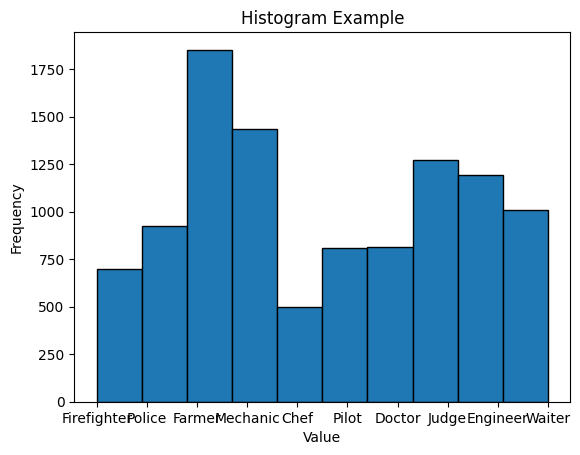

In [31]:
import matplotlib.pyplot as plt

# Sample list of data

# Create a histogram
plt.hist(preds, bins=10, edgecolor='k')  # 'bins' determines the number of bins or bars

# Add labels and a title
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram Example')

# Show the histogram
plt.show()

In [40]:
dataset

Name:        local_images_dir
Media type:  image
Num samples: 31703
Persistent:  True
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    pred:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Classification)
    eval_pred:    fiftyone.core.fields.BooleanField

In [ ]:
for i in view.take(10).iter_samples():
    print(i.ground_truth.detections)

[<Detection: {
    'id': '653ef8a47010e6da3ae03dde',
    'attributes': {},
    'tags': [],
    'label': 'Mechanic',
    'bounding_box': [
        0.5629111111111111,
        0.30590666666666666,
        0.17054222222222223,
        0.6171733333333334,
    ],
    'mask': None,
    'confidence': None,
    'index': None,
    'person_id': 509933224511290,
    'class2': 'none',
    'hairtype': 'wavy',
    'haircolor': 'grey',
    'has_facial_hair': False,
    'has_tattoo': False,
    'has_cap': False,
    'has_mask': False,
    'has_headscarf': False,
    'has_eyeware': False,
    'perceived_age_presentation': 'na',
    'perceived_gender_presentation': 'masc',
    'skin_tone': {
        'skin_tone_1': 0,
        'skin_tone_2': 2,
        'skin_tone_3': 3,
        'skin_tone_4': 2,
        'skin_tone_5': 0,
        'skin_tone_6': 0,
        'skin_tone_7': 0,
        'skin_tone_8': 0,
        'skin_tone_9': 0,
        'skin_tone_10': 0,
        'skin_tone_na': 0,
    },
    'lighting': 'well 

In [44]:
# desired attribute list
attributes = {
    'hairtype': ['straight', 'curly', 'bald', 'wavy', 'dreadlocks', 'coily'],
    'haircolor': ['black', 'blonde', 'red', 'colored', 'brown', 'grey'],
    'perceived_age_presentation': ['young', 'middle', 'older'],
    'perceived_gender_presentation': ['fem', 'masc', 'non binary'],
    'has_facial_hair': [False, True],
    'has_tattoo': [False, True],
    'has_cap': [False, True],
    'has_mask': [False, True],
    'has_headscarf': [False, True],
    'has_eyeware': [False, True],    
}


In [45]:
# Dictionary to store cumulative disparity and count for each combination
disparity_dict = {}

# Iterate through each concept
for concept in concepts:
    # Iterate through each attribute
    for attribute_name, attribute_values in attributes.items():
        total_disparity = 0
        count = 0
        # Iterate through each pair of attribute values
        for i in range(len(attribute_values)):
            for j in range(i + 1, len(attribute_values)):
                attribute1 = {attribute_name: attribute_values[i]}
                attribute2 = {attribute_name: attribute_values[j]}
                # Compute disparity
                disparity = compute_disparity(view, 'pred', concept, attribute1, attribute2)
                total_disparity += abs(disparity)
                count += 1
        # Update the dictionary with the average disparity for this attribute within this concept
        key = (concept, attribute_name)
        average_disparity = total_disparity / count if count > 0 else 0
        disparity_dict[key] = average_disparity

# Output the average disparity for each attribute within each concept
for key, average_disparity in disparity_dict.items():
    concept, attribute_name = key
    print(f'Average disparity for {attribute_name} in concept {concept}: {average_disparity:.4f}')


Average disparity for hairtype in concept Police: 0.10128
Average disparity for haircolor in concept Police: 0.09825
Average disparity for perceived_age_presentation in concept Police: 0.03585
Average disparity for perceived_gender_presentation in concept Police: 0.05182
Average disparity for has_facial_hair in concept Police: 0.04310
Average disparity for has_tattoo in concept Police: 0.07166
Average disparity for has_cap in concept Police: 0.01695
Average disparity for has_mask in concept Police: 0.01263
Average disparity for has_headscarf in concept Police: 0.05194
Average disparity for has_eyeware in concept Police: 0.03283
Average disparity for hairtype in concept Mechanic: 0.11255
Average disparity for haircolor in concept Mechanic: 0.11408
Average disparity for perceived_age_presentation in concept Mechanic: 0.01898
Average disparity for perceived_gender_presentation in concept Mechanic: 0.16852
Average disparity for has_facial_hair in concept Mechanic: 0.02557
Average disparity

In [46]:
# Dictionary to store cumulative disparity and count for each concept
concept_disparity_dict = {}

# Iterate through each concept
for concept in concepts:
    total_disparity = 0
    count = 0
    # Iterate through each attribute
    for attribute_name, attribute_values in attributes.items():
        # Iterate through each pair of attribute values
        for i in range(len(attribute_values)):
            for j in range(i + 1, len(attribute_values)):
                attribute1 = {attribute_name: attribute_values[i]}
                attribute2 = {attribute_name: attribute_values[j]}
                # Compute disparity
                disparity = compute_disparity(view, 'pred', concept, attribute1, attribute2)
                total_disparity += abs(disparity)
                count += 1
    # Update the dictionary with the average disparity for this concept
    average_disparity = total_disparity / count if count > 0 else 0
    concept_disparity_dict[concept] = average_disparity

# Output the average disparity for each concept
for concept, average_disparity in concept_disparity_dict.items():
    print(f'Average disparity in concept {concept}: {average_disparity:.4f}')


Average disparity in concept Police: 0.08298
Average disparity in concept Mechanic: 0.09907
Average disparity in concept Pilot: 0.14177
Average disparity in concept Firefighter: 0.25681
Average disparity in concept Doctor: 0.25340
Average disparity in concept Farmer: 0.12404
Average disparity in concept Engineer: 0.05049
Average disparity in concept Waiter: 0.23671
Average disparity in concept Judge: 0.30695
Average disparity in concept Chef: 0.38835


In [53]:
mean_disparity = round(np.mean(list(concept_disparity_dict.values())), 4)
mean_disparity

0.1941

In [55]:
file_name = f'mean_total_disparity_{weights_path.replace(".pth", "")}.txt'
with open(file_name, 'w') as file:
    file.write(str(mean_disparity))

In [56]:
# Create the file name
file_name = f'mean_concept_disparity_{weights_path.replace(".pth", "")}.txt'

with open(file_name, 'w') as file:
    json.dump(concept_disparity_dict, file, indent=4)

print(f'Dictionary saved to {file_name}')

Dictionary saved to mean_concept_disparity_student_model_weights_ckd_1.txt
